# Deep Convolutional Generative Adversarial Network (DCGAN) 
## Author: Dream Gonsalves
##### Pattern Recognition Report 
Task 6 : Create a generative model of the OASIS brain dataset using a [DCGAN](https://arxiv.org/abs/1511.06434) that
has a “reasonably clear image” and a [Structured Similarity (SSIM)](https://en.wikipedia.org/wiki/Structural_similarity) of over 0.6. [Hard Difficulty]

##### Refercence: [DCGAN](https://www.tensorflow.org/tutorials/generative/dcgan)

#### Dependencies

In [1]:
import DCGAN #DCGAN.py the helper file

import glob
import cv2
import tensorflow as tf
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
from tensorflow.keras import layers
import time
from IPython import display

In [2]:
tf.__version__

'2.1.0'

#### Getting the required data

In [3]:
data_dir = "C:/Users/s4597082/Downloads/keras_png_slices_data/keras_png_slices_data/keras_png_slices_train/"
BUFFER_SIZE = 60000
BATCH_SIZE = 256
(tf_X_train,train_dataset)=DCGAN.load_image(data_dir,BATCH_SIZE,BUFFER_SIZE)

#### After preprocessing the data

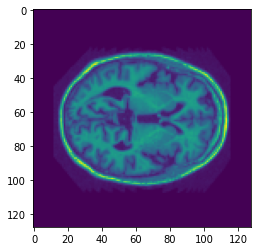

In [8]:
plt.imshow(tf_X_train[0])

In [16]:
train_dataset

<BatchDataset shapes: (None, 128, 128, 1), types: tf.float32>

#### Calling the Generator Model from DCGAN.py

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 65536)             6553600   
_________________________________________________________________
batch_normalization (BatchNo (None, 65536)             262144    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 65536)             0         
_________________________________________________________________
reshape (Reshape)            (None, 16, 16, 256)       0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 128)       819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 128)       512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 128)       0

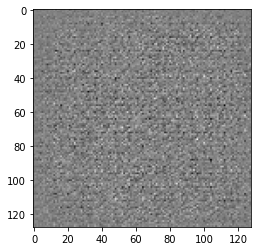

In [18]:
generator = DCGAN.generator_model()
generator.summary()

#Example of image generation using Generator Function from DCGAN.py
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

#### Calling the Discriminator Model from DCGAN.py

In [20]:
discriminator = DCGAN.discriminator_model()
discriminator.summary()
decision = discriminator(generated_image)
print (decision)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 64)        1664      
_________________________________________________________________
batch_normalization_3 (Batch (None, 64, 64, 64)        256       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 64, 64, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 128)       204928    
_________________________________________________________________
batch_normalization_4 (Batch (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 32, 32, 128)      

#### Cross entropy loss function of the Generator and Discriminator

In [21]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [22]:
#Discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [23]:
#Generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [24]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

#### Training the models for 500 iterations until ssim > 0.6 is reached

In [26]:
EPOCHS = 500
noise_dim = 100
num_examples_to_generate = 16

#seed for fake image generation
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [27]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return (gen_loss,disc_loss)

In [36]:
ssims=[]
ssims_max=[]
gen_losses=[]
disc_losses=[]

def train(dataset, epochs):
    for epoch in range(epochs):
    start = time.time()

        for image_batch in dataset:
            (gen_loss,disc_loss)=train_step(image_batch)

        # For producing GIF     
        generate_and_save_images(generator,
                                 epoch + 1,
                                 seed)

        gen_losses.append(gen_loss.numpy())
        disc_losses.append(disc_loss.numpy())

        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

        test_img = tf.image.convert_image_dtype(generator.predict(np.asarray(seed).reshape(16,100))[0],tf.float32,saturate=False,name=None)
        
        #Get the SSIM by comparing with all the train images and return the maximum of all
        ssim_max=DCGAN.get_ssim_max(tf_X_train[:1000],test_img)

        ssims_max.append(ssim_max)
        print('ssim_max =',ssim_max)

        if(ssim_max > 0.6):
            break

    # Generate after the final epoch
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                           epochs,
                           seed)
    

#### Generating and saving the fake images generated

In [37]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4,4))

    for i in range(predictions.shape[0]):
        plt.subplot(4,4, i+1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    plt.savefig('H:/Documents/PatternPracs/Report/Train_results/image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

#### Call train function

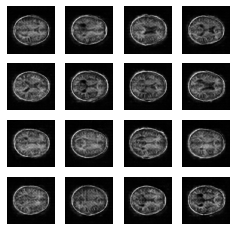

Time for epoch 78 is 16.193790435791016 sec
ssim_max = 0.60900414


In [38]:
train(train_dataset, EPOCHS)

#### gif generation

In [46]:
anim_file = 'C:/Users/s4597082/Downloads/dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('H:/Documents/PatternPracs/Report/Train_results/image*.png') #Saved generated images location
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)


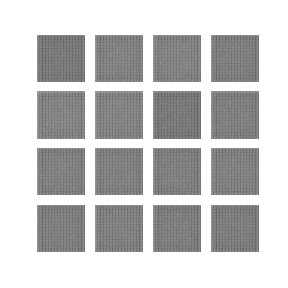

In [48]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

#### Generator and discriminator loss plots using DCGAN.py

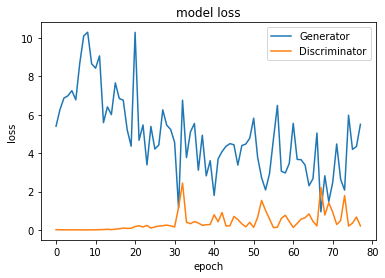

In [39]:
DCGAN.loss_plots(gen_losses,disc_losses)

#### SSIM plot using DCGAN.py

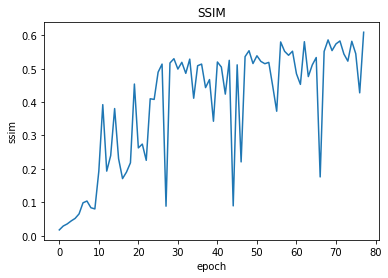

In [41]:
DCGAN.ssim_plot(ssims_max)